In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install gdown

In [ ]:
#!gdown 1co9mz1hJyK19JEenwbcDdG1zMzSEjRnJ
!wget -c https://www.ncc.unesp.br/datatrieste2025/Data-20250811T082927Z-1-001.zip
#!gdown 1PF5qJkkerCZACWHaGHTY5N35cW6l_Tjs
!wget -c https://www.ncc.unesp.br/datatrieste2025/Data-20250811T082927Z-1-002.zip

--2025-08-11 12:09:54--  https://www.ncc.unesp.br/datatrieste2025/Data-20250811T082927Z-1-001.zip
Resolving www.ncc.unesp.br (www.ncc.unesp.br)... 200.145.46.8, 2801:88:3cc:46:5054:ff:fe5b:56a4
Connecting to www.ncc.unesp.br (www.ncc.unesp.br)|200.145.46.8|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

--2025-08-11 12:09:56--  https://www.ncc.unesp.br/datatrieste2025/Data-20250811T082927Z-1-002.zip
Resolving www.ncc.unesp.br (www.ncc.unesp.br)... 200.145.46.8, 2801:88:3cc:46:5054:ff:fe5b:56a4
Connecting to www.ncc.unesp.br (www.ncc.unesp.br)|200.145.46.8|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.



In [ ]:
!mkdir -p "Urban Data Science/Day 1/Data/"
!unzip Data-20250811T082927Z-1-001.zip -d "Urban Data Science/Day 1/"
!unzip Data-20250811T082927Z-1-002.zip -d "Urban Data Science/Day 1/"

Archive:  Data-20250811T082927Z-1-001.zip
replace Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary_projected.dbf? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary.sbx? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary.prj? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary_projected.prj? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary.shx? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary.shx? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary.shx  
  inflating: Urban Data Science/Day 1/Data/Admin_boundary/Austria_Admin_Boundary.shp  
  inflati

## 1. Introduction to Spatial Urban Data
Urban data refers to any data that represents characteristics of urban environments.The most important characterstics of data is that is has location information. It includes following data models vector data (like buildings, roads, and administrative boundaries) and raster data (like satellite images or solar potential maps).

In [2]:
# ============================================
# LIBRARY IMPORTS FOR URBAN DATA SCIENCE
# ============================================

# Basic Data Handling and Analysis
import pandas as pd       # For handling tabular data (CSV, Excel, DataFrames)
import numpy as np        # For numerical operations and array manipulation

# Geospatial Data Processing
import geopandas as gpd   # Extends pandas with support for geospatial data (shapefiles, GeoJSON)
from shapely.geometry import Point, Polygon  # For handling geometric objects like points, lines, polygons

# Mapping & Visualization
import matplotlib.pyplot as plt     # For standard plotting (line plots, bar charts, etc.)
import seaborn as sns               # For advanced statistical plots (heatmaps, correlation)
import folium                       # For interactive web-based maps (Leaflet.js)

# Raster Data (for remote sensing and surface analysis)
!pip install rasterio
import rasterio                     # For reading and manipulating raster (satellite) data
from rasterio.plot import show     # Quick display of raster data

# Date-Time Handling
import datetime                    # Useful for working with time-based trends (e.g., population over years)

# File Operations and System
import os                          # For working with file paths and directories



# Confirmation Message
print("All essential libraries have been imported successfully")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 60.1 MB/s eta 0:00:00
All essential libraries have been imported successfully


## Understanding the Raster Data Model
The Raster data model represents geographic phenomena as a grid of cells (pixels). Each cell has a value representing information such as:


*   Reflectance (e.g., satellite imagery: Sentinel-2 bands)
*   Elevation (e.g., DEMs)
*   Temperature, vegetation index, or land cover class

This model is best suited for continuous data — like land use, surface temperature, NDVI, rainfall, and satellite imagery.



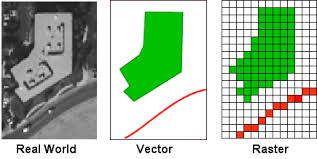

Image Source: GIS Commons - Spatial Data Models

## Comparison: Vector vs Raster

| Feature         | Vector                            | Raster                                  |
| --------------- | --------------------------------- | --------------------------------------- |
| Data Type       | Points, Lines, Polygons           | Grid of cells (matrix of pixels)        |
| Use Case        | Infrastructure, boundaries, roads | Imagery, elevation, heat, vegetation    |
| File Examples   | `.shp`, `.geojson`, `.kml`                | `.tif`, `.img`, `.asc`, `.jpeg2000`     |
| Precision       | High (geometry-based)             | Depends on resolution (e.g., 10m/pixel) |
| Example Dataset | City boundaries, road networks    | Sentinel-2 imagery, DEM, NDVI           |


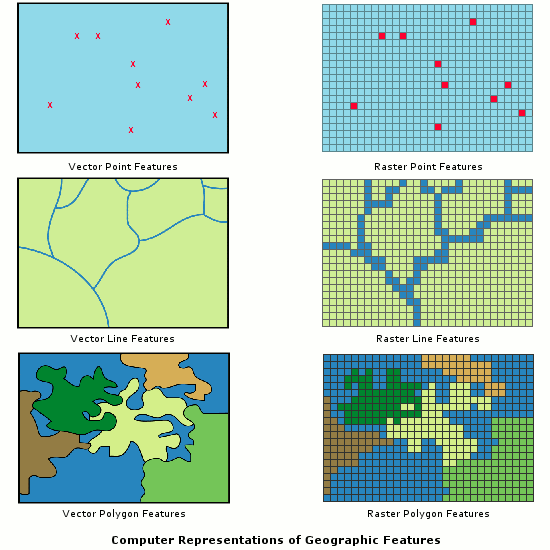

Image source: USGS

## Common Sentinel-2 Bands Used in Urban Analysis


| Band Name | Description         | Wavelength (nm) | Use Case                        |
| --------- | ------------------- | --------------- | ------------------------------- |
| B2        | Blue                | \~490           | Urban surface, water, haze      |
| B3        | Green               | \~560           | Vegetation, impervious surfaces |
| B4        | Red                 | \~665           | Urban sprawl, land cover        |
| B8        | NIR (Near Infrared) | \~842           | NDVI, vegetation health         |
| B11/B12   | SWIR                | \~1610 / \~2190 | Built-up vs natural surfaces    |


### Understanding ESA Sentinel-2 File Naming Conventions

ESA (European Space Agency) uses specific codes in the filenames of Sentinel-2 data products. Here's a breakdown of a typical name:

- **S2A**: Refers to the **Sentinel-2A** satellite. Sentinel-2 has two satellites: S2A and S2B, which capture optical images of Earth's surface.
  
- **MSIL2A**: Indicates the **processing level** of the data.  
  - **L2A** (Level-2A) means the image has been **corrected for atmospheric effects**, providing **bottom-of-atmosphere reflectance**.  
  - This level is suitable for analysis without needing further correction.

- **T33UVP**: This is the **tile ID**, identifying the specific region captured by the satellite.  
  - In this example, the tile covers the **Linz region** in Austria.

- **20250514**: The **acquisition date** in the format **YYYYMMDD**.  
  - Here, the image was captured on **May 14, 2025**.

These codes help users quickly identify what satellite and region the data comes from, how it was processed, and when it was acquired.


In [3]:
import os
#from google.colab import drive
#drive.mount('/content/drive')
b4 = (r'/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/')

#b4 = "Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B04_10m.jp2"
print("Exists:", os.path.exists(b4))

Exists: True


CRS: EPSG:32633
Resolution: (10.0, 10.0)


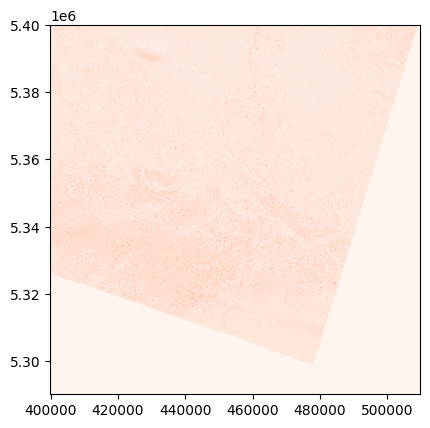

In [4]:
import rasterio
from rasterio.plot import show

# Path to the band file
b4 = (r'/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B04_10m.jp2')

# Open the raster file
with rasterio.open(b4) as b4:
    print("CRS:", b4.crs)
    print("Resolution:", b4.res)
    show(b4, cmap='Reds')

## Now lets Stack Red Green and Blue bands to get the true color composition (Imagery)

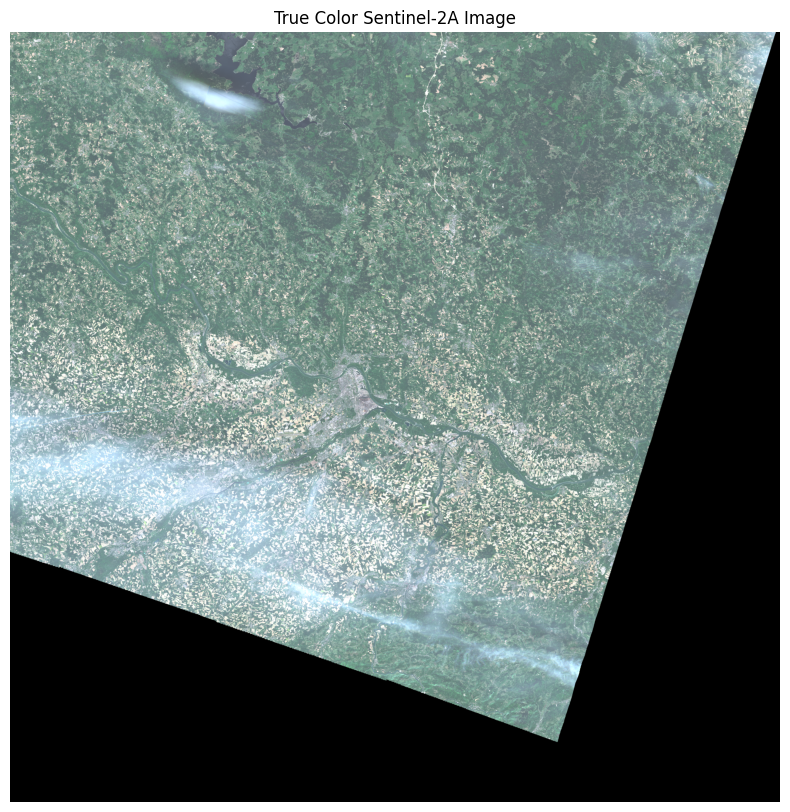

In [6]:
!pip install rasterio

import numpy as np
import matplotlib.pyplot as plt

# Define band paths
b4_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B04_10m.jp2"  # Red
b3_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B03_10m.jp2"  # Green
b2_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B02_10m.jp2"  # Blue

# Define band paths
#b4_path = "Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B04_10m.jp2"  # Red
#b3_path = "Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B03_10m.jp2"  # Green
#b2_path = "Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B02_10m.jp2"  # Blue


# Read bands as arrays
with rasterio.open(b4_path) as b4_src, \
     rasterio.open(b3_path) as b3_src, \
     rasterio.open(b2_path) as b2_src:

    red = b4_src.read(1)
    green = b3_src.read(1)
    blue = b2_src.read(1)
    meta = b4_src.meta  # Save metadata if needed

# Stack the bands into a single RGB image array
# Each of 'red', 'green', and 'blue' is assumed to be a 2D NumPy array (single spectral band)
# axis=-1 means we add them as separate channels in the last dimension
rgb = np.stack([red, green, blue], axis=-1)

# Define a function to normalize an image for display
# Normalization enhances contrast by stretching pixel values to the 0–1 range
# We use the 2nd and 98th percentiles to avoid extreme outliers (clouds, shadows, etc.)
def normalize(img):
    img_min, img_max = np.percentile(img, (2, 98))  # Compute lower & upper percentile values
    return np.clip((img - img_min) / (img_max - img_min), 0, 1)  # Scale and clip between 0–1

# Apply normalization to each spectral band separately, then stack them again
# np.dstack stacks 2D arrays along a new third dimension (channels)
rgb_norm = np.dstack([normalize(red), normalize(green), normalize(blue)])

# Create a plot to display the normalized RGB image
plt.figure(figsize=(10, 10))  # Set figure size to 10x10 inches
plt.imshow(rgb_norm)          # Show the normalized RGB image
plt.title("True Color Sentinel-2A Image")  # Add a title
plt.axis("off")               # Hide axis ticks and labels for a cleaner image display
plt.show()                    # Render the plot



## Normalize using percentiles for better contrast

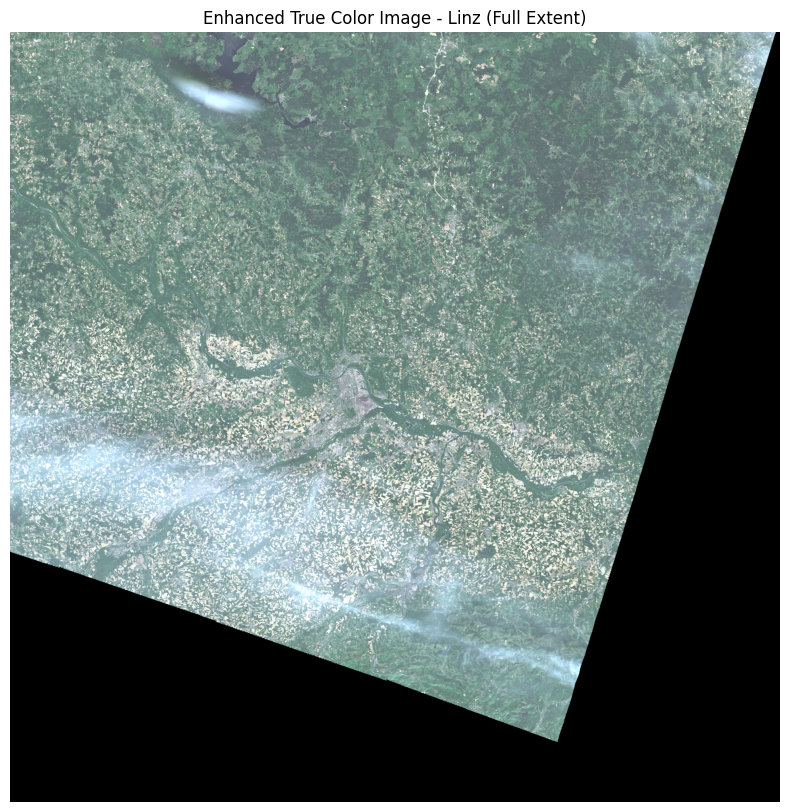

In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Define band paths
b4_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B04_10m.jp2"  # Red
b3_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B03_10m.jp2"  # Green
b2_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B02_10m.jp2"  # Blue

# Read and normalize Sentinel-2 RGB bands (B4=red, B3=green, B2=blue)
# Using rasterio to open and read GeoTIFF files

# Read and normalize
with rasterio.open(b4_path) as src4, \
     rasterio.open(b3_path) as src3, \
     rasterio.open(b2_path) as src2:

    r = src4.read(1).astype('float32')
    g = src3.read(1).astype('float32')
    b = src2.read(1).astype('float32')

    def normalize(band):
        min_val, max_val = np.percentile(band, (2, 98))
        return np.clip((band - min_val) / (max_val - min_val), 0, 1)

    rgb = np.dstack([normalize(r), normalize(g), normalize(b)])

# Plot full image
plt.figure(figsize=(10, 10))
plt.imshow(rgb)
plt.title("Enhanced True Color Image - Linz (Full Extent)")
plt.axis("off")
plt.show()

#We can break down Normalization in three simple steps of Code  
This code reads the red (B04), green (B03), and blue (B02) spectral bands from a Sentinel-2A Level-2A product and prepares them for further processing or visualization.

The file paths point to 10-meter resolution JPEG2000 (.jp2) files located inside the Sentinel-2 SAFE directory structure.
The code uses rasterio to open each band file, read the raster data into a NumPy array, and store it as float32 for accurate numerical calculations such as normalization, band arithmetic, or RGB compositing.

In [ ]:
# Import necessary libraries
import rasterio                      # For reading/writing raster (GeoTIFF, JP2) files
import numpy as np                   # For numerical operations on raster arrays
import matplotlib.pyplot as plt      # For visualization

# --------------------------------------------------------
# File paths to Sentinel-2A RGB bands (10 m resolution)
# --------------------------------------------------------
# B04 = Red band (wavelength ~665 nm)
# B03 = Green band (wavelength ~560 nm)
# B02 = Blue band (wavelength ~490 nm)
# These files are JPEG2000 (.jp2) format inside the Sentinel-2 SAFE directory structure
b4_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B04_10m.jp2"  # Red
b3_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B03_10m.jp2"  # Green
b2_path = "/content/drive/MyDrive/Urban Data Science/Day 1/Data/Sentinel/S2A_MSIL2A_20250514T101041_N0511_R022_T33UVP_20250514T154511.SAFE/GRANULE/L2A_T33UVP_A051671_20250514T101041/IMG_DATA/R10m/T33UVP_20250514T101041_B02_10m.jp2"  # Blue

# --------------------------------------------------------
# Read each band as a NumPy array
# --------------------------------------------------------
# rasterio.open() is used as a context manager (`with`) so the file closes automatically after reading.
# .read(1) reads the first raster band (Sentinel-2 bands are single-band files)
# .astype('float32') ensures values are stored as floating-point numbers for further calculations

with rasterio.open(b4_path) as red_src:
    red = red_src.read(1).astype('float32')     # Red band

with rasterio.open(b3_path) as green_src:
    green = green_src.read(1).astype('float32') # Green band

with rasterio.open(b2_path) as blue_src:
    blue = blue_src.read(1).astype('float32')   # Blue band

# Normalize a band using 2nd and 98th percentiles to avoid extreme values
def normalize(band):
    min_val, max_val = np.percentile(band, (2, 98))
    return np.clip((band - min_val) / (max_val - min_val), 0, 1)

# Apply normalization to each band
red_norm = normalize(red)
green_norm = normalize(green)
blue_norm = normalize(blue)

# Stack normalized bands into an RGB image
rgb_image = np.dstack((red_norm, green_norm, blue_norm))

# Display the true-color image
plt.figure(figsize=(10, 10))
plt.imshow(rgb_image)
plt.title("True Color Sentinel-2A Image")
plt.axis("off")
plt.show()

#Decoding the Landsat 9 Scene Identifier
LC09_L2SP_191026_20250618_20250621_02_T1 can be broken down as follows:

- **LC09**: Refers to the **Landsat 9** satellite (**L**andsat **C**ollection 2, sensor = OLI/TIRS, satellite = 09).

- **L2SP**: Indicates the **processing level** and **product type**:
  - **L2** = Level-2 surface reflectance data (corrected for atmospheric effects).
  - **SP** = Standard Product.

- **191026**: The **WRS-2 Path and Row** — identifies the location of the image.
  - **Path 191**, **Row 026** (a specific tile on Earth's surface).

- **20250618**: The **acquisition date** (YYYYMMDD) — the date the image was taken:
  - **June 18, 2025**.

- **20250621**: The **processing date** — when the data was processed:
  - **June 21, 2025**.

- **02**: **Collection number** — Collection 2, which includes improved geometric and radiometric processing.

- **T1**: **Tier level**:
  - **T1** = Tier 1, which means it meets the highest geometric accuracy standards.


## Now lets load a single band of Imagery

CRS: EPSG:32633
Resolution: (30.0, 30.0)


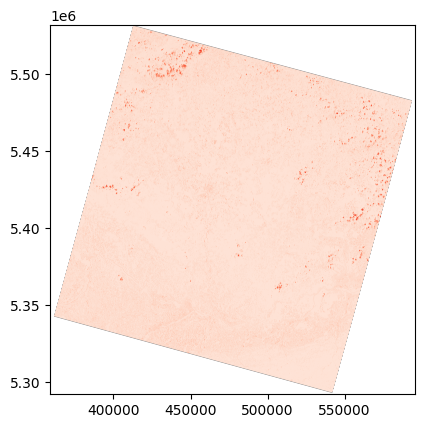

In [ ]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Path to Red band (B04)
red_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B4.TIF"

with rasterio.open(red_path) as red_band:
    print("CRS:", red_band.crs)
    print("Resolution:", red_band.res)
    show(red_band, cmap='Reds')

## Now lets Stack Red Green and Blue bands to get the true color composition (Imagery)

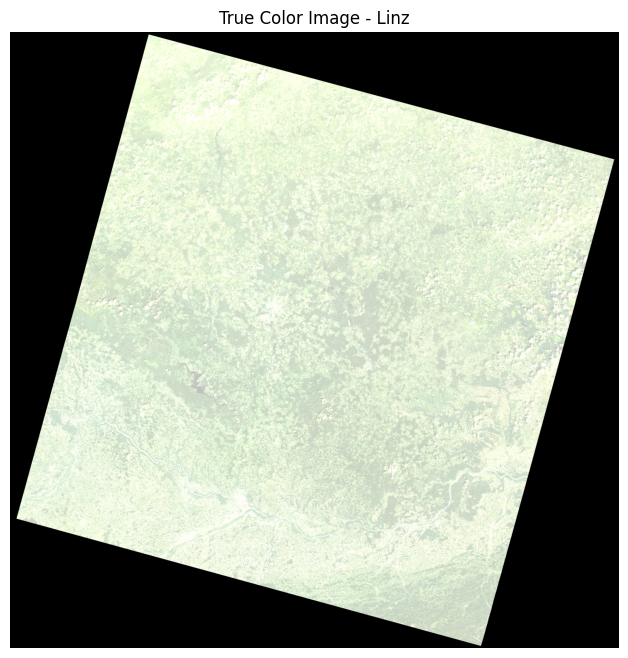

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt


# Define paths
b4 = rasterio.open(r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B4.TIF")  # Red
b3 = rasterio.open(r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B3.TIF")  # Green
b2 = rasterio.open(r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B2.TIF")  # Blue

# Stack bands
rgb = np.stack([b4.read(1), b3.read(1), b2.read(1)])

# Plot RGB image
plt.figure(figsize=(8,8))
plt.imshow(np.transpose(rgb, (1, 2, 0)) / 10000)  # Normalize if needed
plt.title("True Color Image - Linz")
plt.axis('off')
plt.show()

## Normalize using percentiles for better contrast

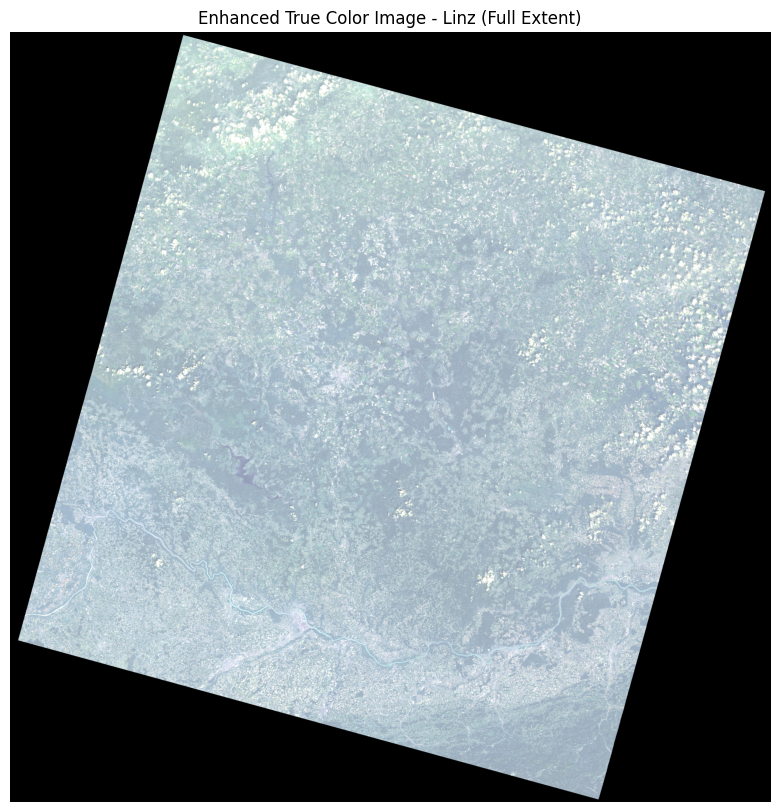

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Open bands
#b4 = rasterio.open(r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B4.TIF")  # Red
#b3 = rasterio.open(r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B3.TIF")  # Green
#b2 = rasterio.open(r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B2.TIF")  # Blue

# Read and normalize
r = b4.read(1).astype('float32')
g = b3.read(1).astype('float32')
b = b2.read(1).astype('float32')

# Normalize using percentiles for better contrast
def normalize(band):
    min_val, max_val = np.percentile(band, (2, 98))
    return np.clip((band - min_val) / (max_val - min_val), 0, 1)

rgb = np.dstack([normalize(r), normalize(g), normalize(b)])

# Plot full image
plt.figure(figsize=(10, 10))
plt.imshow(rgb)
plt.title("Enhanced True Color Image - Linz (Full Extent)")
plt.axis("off")
plt.show()


We can break down Normalization in three simple steps of Code  

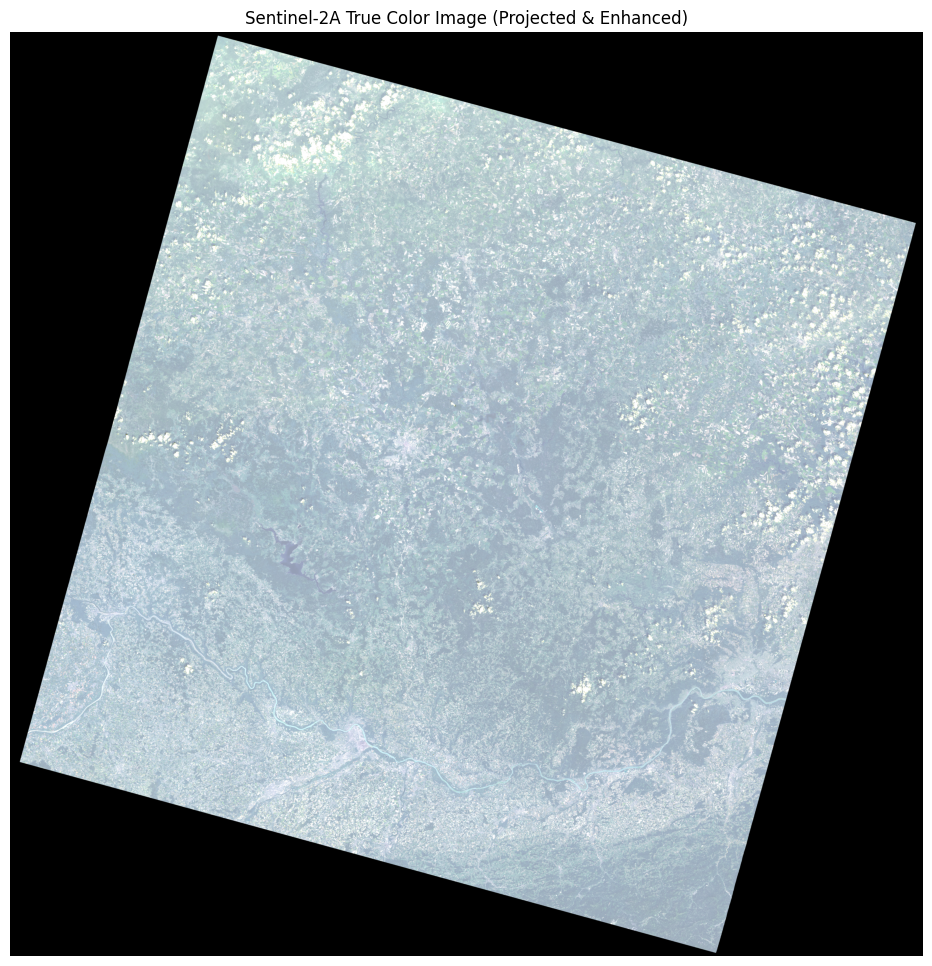

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# Paths to R, G, B bands
#base = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/"
b4_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B4.TIF"
b3_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B3.TIF"
b2_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B2.TIF"

# Read bands
with rasterio.open(b4_path) as red_src:
    red = red_src.read(1).astype('float32')

with rasterio.open(b3_path) as green_src:
    green = green_src.read(1).astype('float32')

with rasterio.open(b2_path) as blue_src:
    blue = blue_src.read(1).astype('float32')

# Apply percentile-based contrast stretching
def normalize(band):
    min_val, max_val = np.percentile(band, (2, 98))
    return np.clip((band - min_val) / (max_val - min_val), 0, 1)

r = normalize(red)
g = normalize(green)
b = normalize(blue)

# Stack into RGB image
rgb_image = np.dstack((r, g, b))

plt.figure(figsize=(12, 12))
plt.imshow(rgb_image)
plt.title("Sentinel-2A True Color Image (Projected & Enhanced)")
plt.axis('off')
plt.show()


lets check the Projection of our Imagery

In [ ]:
print("CRS of image:", red_src.crs)

CRS of image: EPSG:32633


In [ ]:
with rasterio.open(b4_path) as src:
    crs = src.crs
    print("EPSG Code:", crs.to_epsg())
    print("\nFull WKT:")
    print(crs.to_wkt())


EPSG Code: 32633

Full WKT:
PROJCS["WGS 84 / UTM zone 33N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32633"]]


Now lets stack Linz Boundary(Vector layer) over the Raster Imagery

Lets ensure the Projections are same

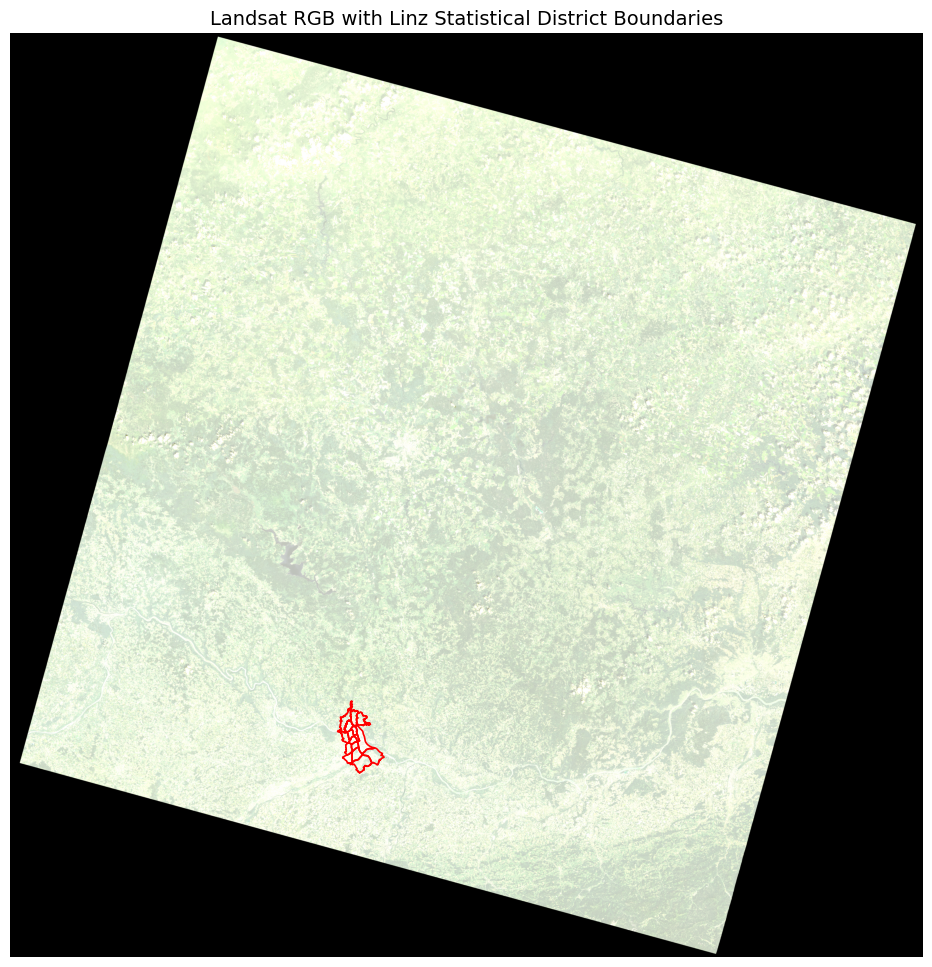

In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from rasterio.transform import xy

# Load RGB bands
with rasterio.open(b4_path) as red_src:
    red = red_src.read(1).astype('float32')
    transform = red_src.transform
    crs = red_src.crs

with rasterio.open(b3_path) as green_src:
    green = green_src.read(1).astype('float32')

with rasterio.open(b2_path) as blue_src:
    blue = blue_src.read(1).astype('float32')

# Create RGB image and normalize
rgb_image = np.dstack((red, green, blue)) / 10000.0

# Load vector data
vector_path  = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/Linz Statistical districts/Statistische_Bezirke_20250428.shp"
gdf = gpd.read_file(vector_path)

# Reproject vector data if needed
if gdf.crs != crs:
    gdf = gdf.to_crs(crs)

# Calculate extent correctly
height, width = rgb_image.shape[:2]
top_left = xy(transform, 0, 0, offset='ul')
bottom_right = xy(transform, height, width, offset='lr')
extent = [top_left[0], bottom_right[0], bottom_right[1], top_left[1]]

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(rgb_image, extent=extent)
gdf.boundary.plot(ax=ax, edgecolor='red', linewidth=1.2)
ax.set_title("Landsat RGB with Linz Statistical District Boundaries", fontsize=14)
ax.axis('off')
plt.show()

## Now lets Clip the Linz Boundary out of large imagery

In [ ]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

Converting Geo Data frame geometry into GeoJSON format for clipping

In [ ]:
from shapely.geometry import mapping
from rasterio.mask import mask

# Convert GeoDataFrame geometries to GeoJSON format
geoms = [mapping(geom) for geom in gdf.geometry]

# Function to clip a raster band using vector geometry
def clip_band(band_path):
    with rasterio.open(band_path) as src:
        out_image, out_transform = mask(src, geoms, crop=True)
        out_meta = src.meta.copy()
        out_meta.update({
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })
    return out_image[0].astype('float32'), out_transform

Clipping all 3 bands for True color composition Visualization

In [ ]:
# Clip the RGB bands to Linz boundary
red_clipped, transform = clip_band(b4_path)
green_clipped, _ = clip_band(b3_path)
blue_clipped, _ = clip_band(b2_path)

In [ ]:
def normalize(band):
    min_val, max_val = np.percentile(band, (2, 98))
    return np.clip((band - min_val) / (max_val - min_val), 0, 1)

r = normalize(red_clipped)
g = normalize(green_clipped)
b = normalize(blue_clipped)

rgb_clipped = np.dstack((r, g, b))


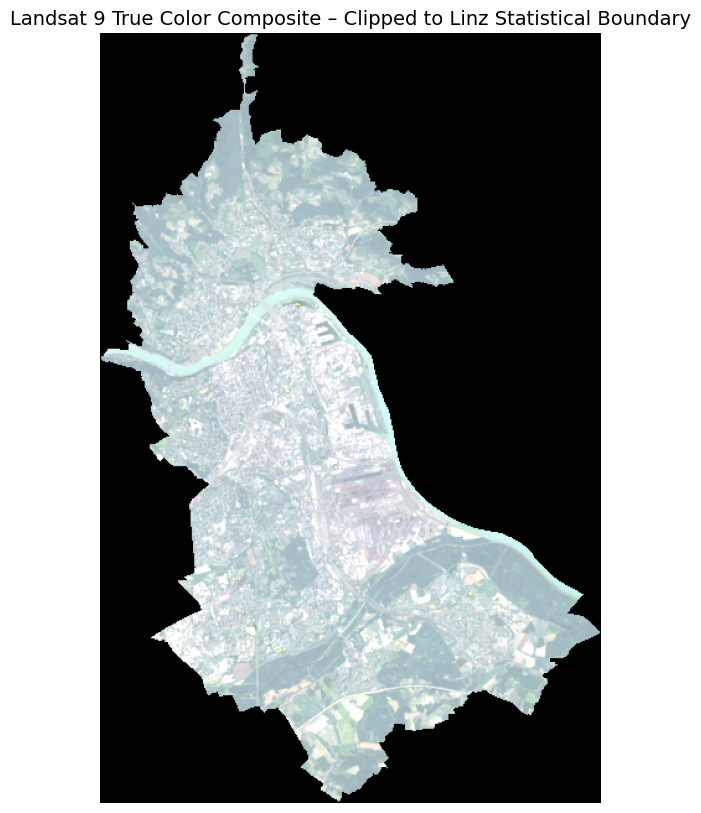

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.imshow(rgb_clipped)
plt.title("Landsat 9 True Color Composite – Clipped to Linz Statistical Boundary", fontsize=14)
plt.axis("off")
plt.show()

## NDVI (Normalized Difference Vegetation Index)
NDVI is one of the most widely used spatial indices in remote sensing — perfect for assessing vegetation health, urban greening, and land cover classification.

NDVI = (NIR - Red) / (NIR + Red)

| Band | Sentinel-2 Index | Purpose                              |
| ---- | ---------------- | ------------------------------------ |
| NIR  | **Band 8**       | Reflects healthy vegetation strongly |
| Red  | **Band 4**       | Absorbed by chlorophyll              |


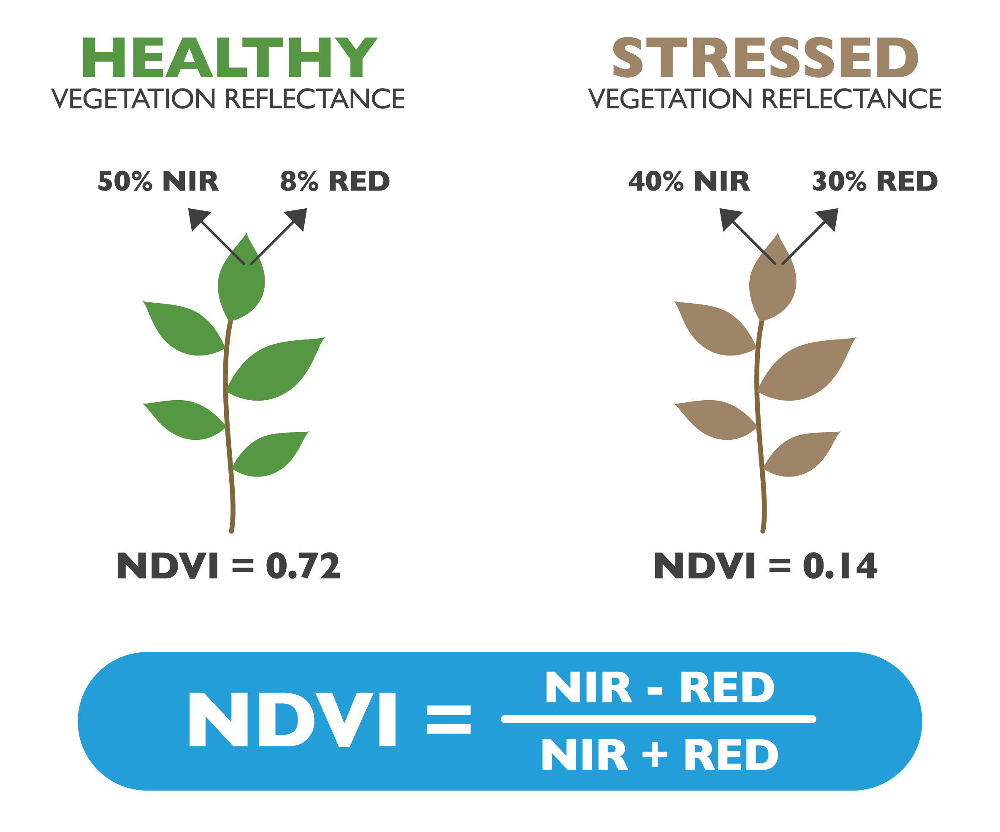

Image Source: EOS Data Analytics (AgriTech)

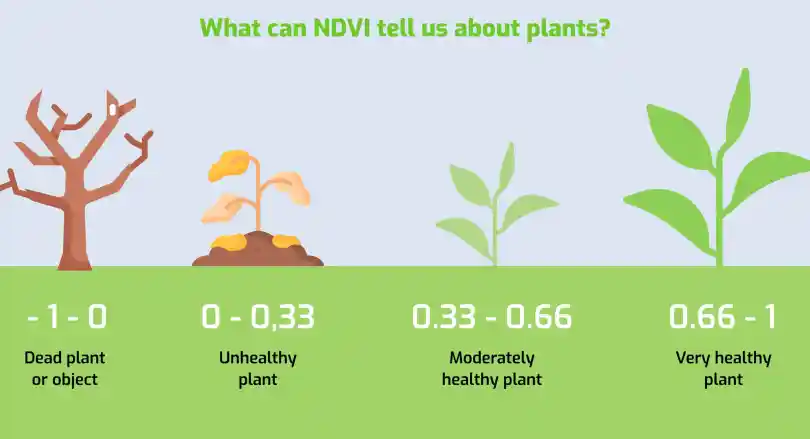

Image Source: NASA ARSET & GISGeography  

Now Lets calculate NDVI for Sentinel Imagery


In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')

b8_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B5.TIF"
print("Exists:", os.path.exists(b8_path))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Exists: True


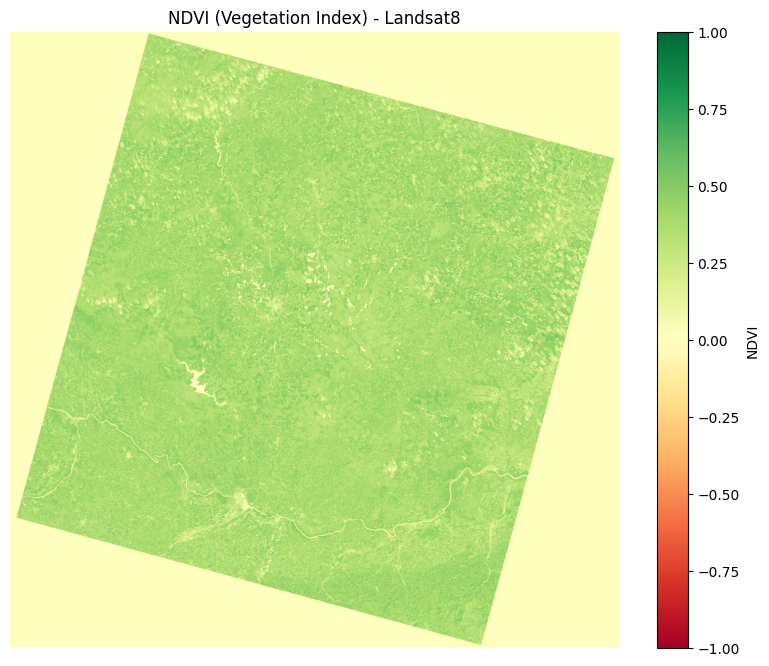

In [ ]:
!pip install rasterio
import numpy as np            # for array math
import rasterio               # for reading GeoTIFFs
import matplotlib.pyplot as plt  # for plotting
# Load Band 8 (NIR) and Band 4 (Red)
b8_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B5.TIF"  # NIR
b4_path = r"/content/drive/MyDrive/Urban Data Science/Day 1/Data/LC09_L2SP_191026_20250618_20250621_02_T1/LC09_L2SP_191026_20250618_20250621_02_T1_SR_B4.TIF"  # Red

# Open both bands
with rasterio.open(b8_path) as nir_src:
    nir = nir_src.read(1).astype('float32')

with rasterio.open(b4_path) as red_src:
    red = red_src.read(1).astype('float32')

# Avoid division by zero using np.seterr
np.seterr(divide='ignore', invalid='ignore')

# Compute NDVI
ndvi = (nir - red) / (nir + red)

# Set values to nan where undefined
ndvi[np.isnan(ndvi)] = 0

# Plot NDVI
plt.figure(figsize=(10, 8))
plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
plt.colorbar(label='NDVI')
plt.title("NDVI (Vegetation Index) - Landsat8")
plt.axis("off")
plt.show()

| NDVI Value Range | Meaning                     |
| ---------------- | --------------------------- |
| \~ 0.6 to 1.0    | Dense healthy vegetation    |
| \~ 0.2 to 0.5    | Sparse vegetation/grass     |
| \~ 0 to 0.2      | Barren or urban surfaces    |
| < 0              | Water, shadows, snow, cloud |

Now Lets Clip Linz and Calculate NDVI

In [ ]:
nir_clipped, _ = clip_band(b8_path)

In [ ]:
def normalize(band):
    min_val, max_val = np.percentile(band, (2, 98))
    return np.clip((band - min_val) / (max_val - min_val), 0, 1)

nir = normalize(nir_clipped)

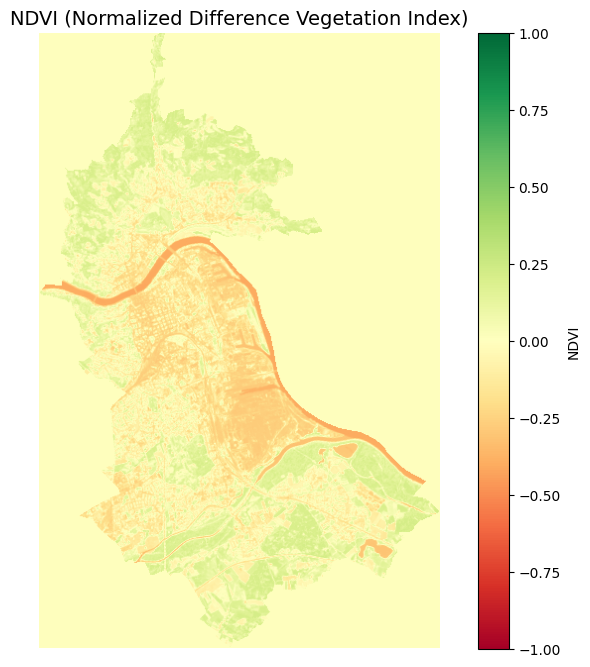

In [ ]:
# Calculate NDVI
ndvi = (nir - r) / (nir + r)

# Handle any divide-by-zero or NaN
ndvi = np.nan_to_num(ndvi)

# Plot the NDVI
plt.figure(figsize=(10, 8))
plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
plt.colorbar(label='NDVI')
plt.title("NDVI (Normalized Difference Vegetation Index)", fontsize=14)
plt.axis("off")
plt.show()

## Stack Buildings and Admin Boundary layer for enhanced Visualization

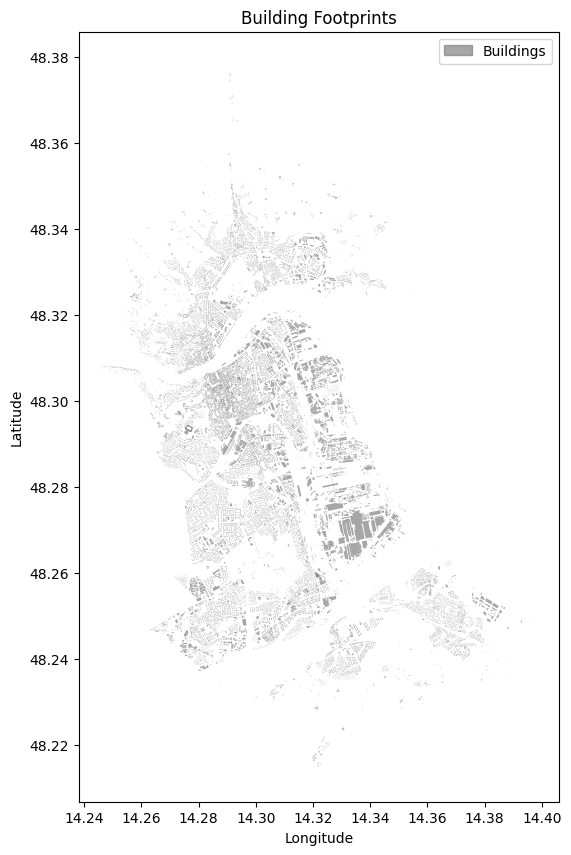

In [ ]:
# Load the building layer
buildings = gpd.read_file(r'/content/drive/MyDrive/Urban Data Science/Day 1/Data/Austria_buildings/Build/Austria_Build.shp')

buildings = buildings.to_crs(epsg=4326)

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Plot the layers
fig, ax = plt.subplots(figsize=(12, 10))

# Plot buildings
buildings.plot(ax=ax, color='gray', alpha=0.7)

# Add title and labels
ax.set_title('Building Footprints')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Create custom legend
building_patch = mpatches.Patch(color='gray', alpha=0.7, label='Buildings')
ax.legend(handles=[building_patch])

# Show the plot
plt.show()

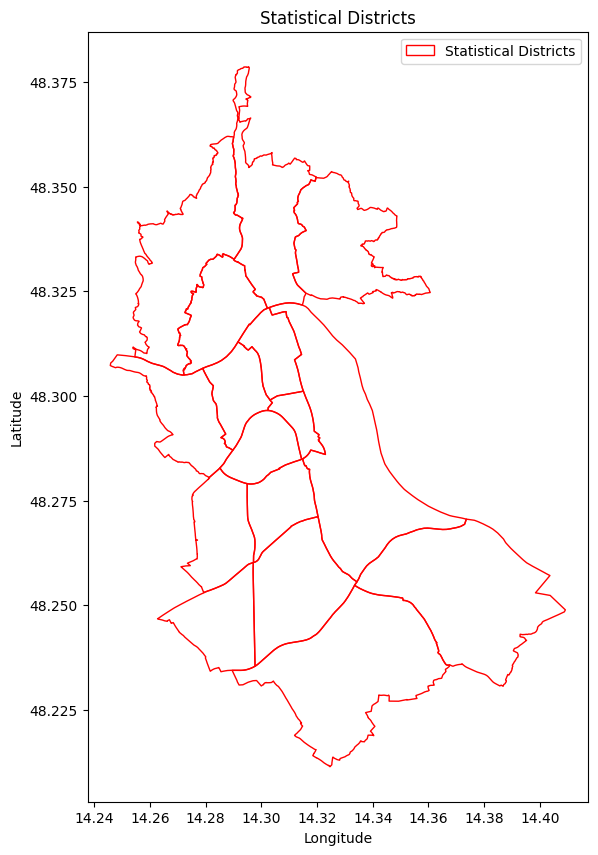

In [ ]:
# Load the statistical districts
statistical_districts = gpd.read_file(r'/content/drive/MyDrive/Urban Data Science/Day 1/Data/Linz Statistical districts/Statistische_Bezirke_20250428.shp')

statistical_districts = statistical_districts.to_crs(epsg=4326)

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Plot the layers
fig, ax = plt.subplots(figsize=(12, 10))

# Plot statistical districts
statistical_districts.plot(ax=ax, edgecolor='red', facecolor='none', linewidth=1)

# Add title and labels
ax.set_title('Statistical Districts')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Create custom legend
district_patch = mpatches.Patch(edgecolor='red', facecolor='none', label='Statistical Districts')
ax.legend(handles=[district_patch])

# Show the plot
plt.show()

/tmp/ipython-input-3208042481.py:16: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


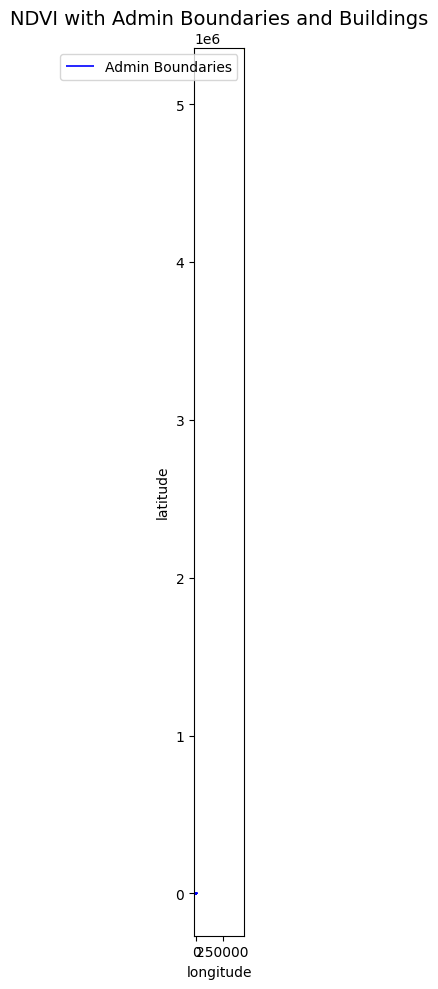

In [ ]:
from rasterio.plot import show

fig, ax = plt.subplots(figsize=(12, 10))

# Plot NDVI correctly with spatial reference
show(ndvi, transform=transform, ax=ax, cmap='RdYlGn', vmin=-1, vmax=1)

# Overlay vector layers
buildings.plot(ax=ax, color='gray', alpha=0.6, linewidth=0.2, label='Buildings')
statistical_districts.boundary.plot(ax=ax, edgecolor='blue', linewidth=1.2, label='Admin Boundaries')

# Add labels and legend
ax.set_title("NDVI with Admin Boundaries and Buildings", fontsize=14)
ax.set_xlabel("longitude")
ax.set_ylabel("latitude")
ax.legend()

plt.tight_layout()
plt.show()

Ensuring all layers share the same projection is essential when stacking or overlaying spatial data, to maintain accurate alignment and spatial consistency


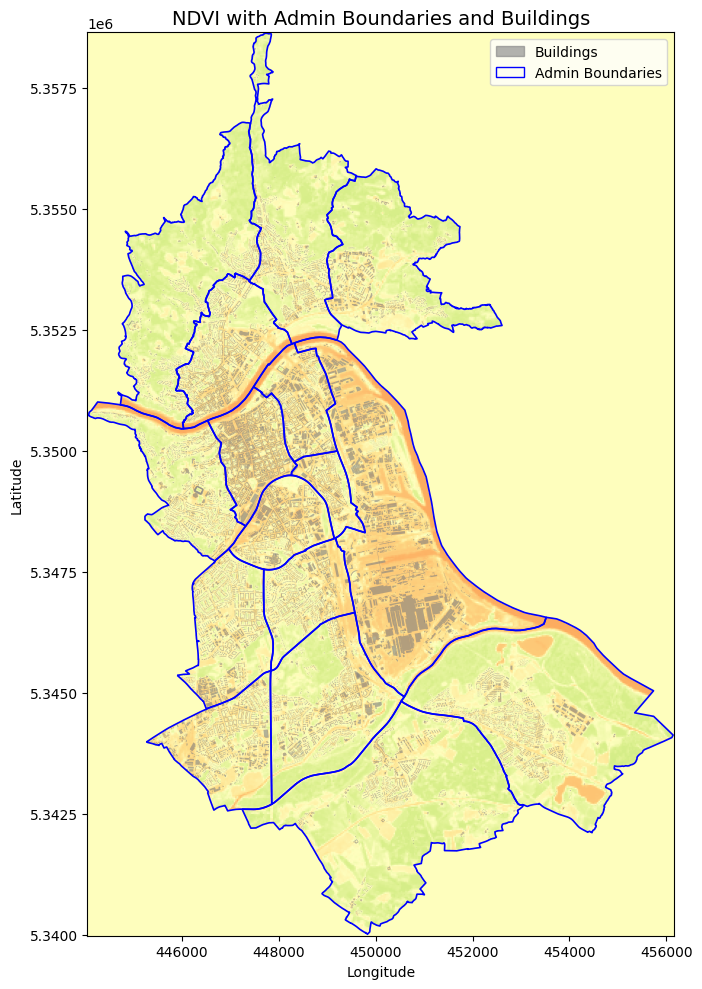

In [ ]:
from rasterio.plot import show
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Reproject both layers to match raster CRS
if buildings.crs != crs:
    buildings = buildings.to_crs(crs)

if statistical_districts.crs != crs:
    statistical_districts = statistical_districts.to_crs(crs)

# Plot
fig, ax = plt.subplots(figsize=(12, 10))

# NDVI raster
show(ndvi, transform=transform, ax=ax, cmap='RdYlGn', vmin=-1, vmax=1)

# Vector overlays
buildings.plot(ax=ax, color='gray', alpha=0.6, linewidth=0.2)
statistical_districts.boundary.plot(ax=ax, edgecolor='blue', linewidth=1.2)

# Manual legend
building_patch = mpatches.Patch(color='gray', label='Buildings', alpha=0.6)
boundary_patch = mpatches.Patch(edgecolor='blue', facecolor='none', label='Admin Boundaries')
ax.legend(handles=[building_patch, boundary_patch])

# Labels
ax.set_title("NDVI with Admin Boundaries and Buildings", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

plt.tight_layout()
plt.show()


/tmp/ipython-input-28-2734710118.py:16: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend()


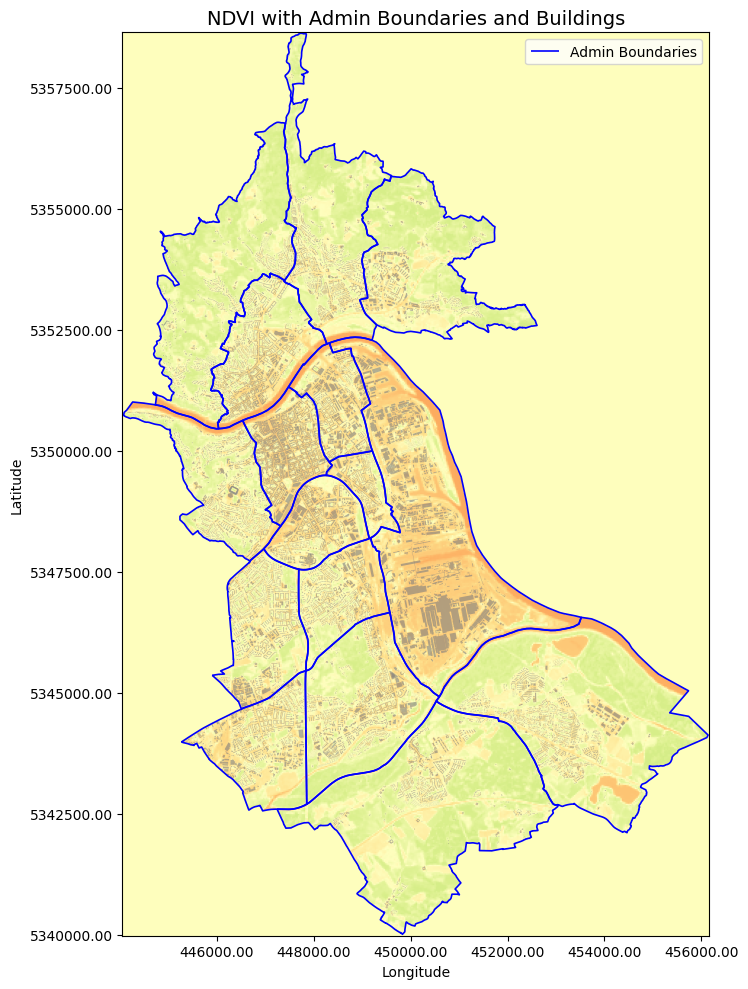

In [ ]:
from matplotlib.ticker import FuncFormatter

fig, ax = plt.subplots(figsize=(12, 10))

# Plot NDVI correctly with spatial reference
show(ndvi, transform=transform, ax=ax, cmap='RdYlGn', vmin=-1, vmax=1)

# Overlay vector layers
buildings.plot(ax=ax, color='gray', alpha=0.6, linewidth=0.2, label='Buildings')
statistical_districts.boundary.plot(ax=ax, edgecolor='blue', linewidth=1.2, label='Admin Boundaries')

# Add labels and legend
ax.set_title("NDVI with Admin Boundaries and Buildings", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()

# Format ticks to 3 decimals
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.2f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.2f}"))

plt.tight_layout()
plt.show()

## Now lets add proper legends for NDVI

In [ ]:
import os
import rasterio

os.environ['PROJ_LIB'] = rasterio.__file__.replace('__init__.py', 'proj_data')

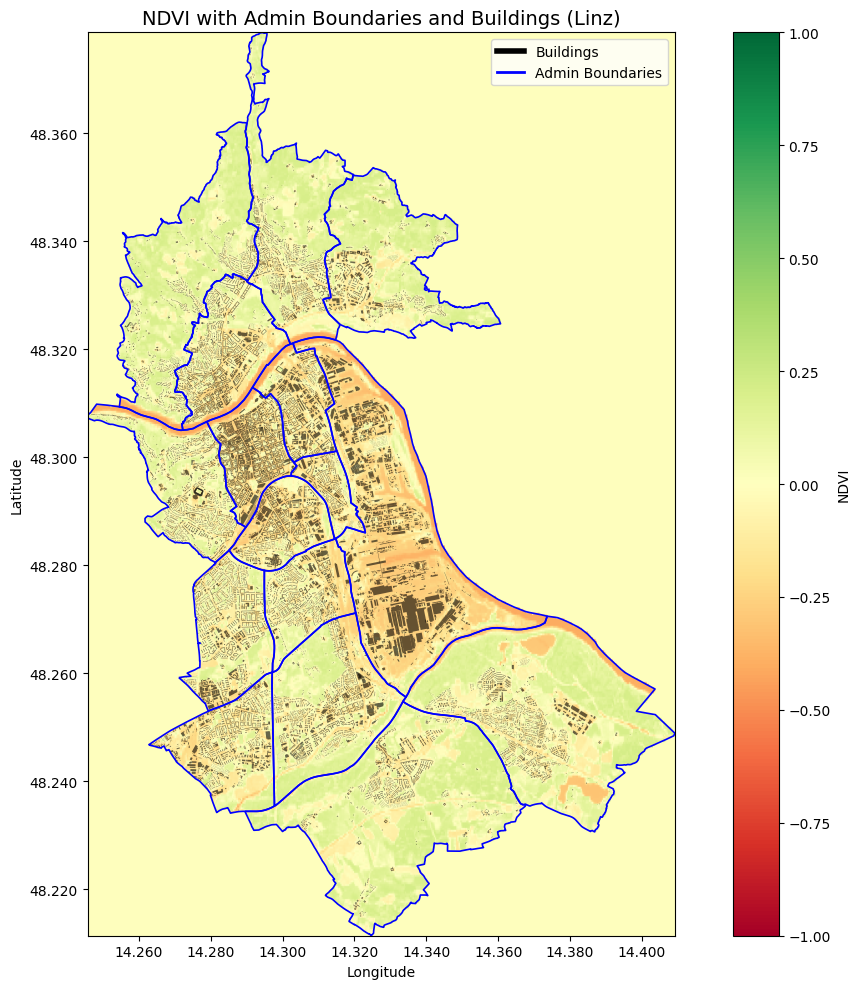

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.plot import show
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

# Reproject NDVI raster to EPSG:4326 (lat/lon)
dst_crs = 'EPSG:4326'

with rasterio.open(b4_path) as src:
    transform_4326, width, height = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    ndvi_4326 = np.empty((height, width), dtype=np.float32)
    reproject(
        source=ndvi,
        destination=ndvi_4326,
        src_transform=transform,
        src_crs=src.crs,
        dst_transform=transform_4326,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

# Reproject vector layers to EPSG:4326 if not already
if buildings.crs.to_epsg() != 4326:
    buildings = buildings.to_crs(epsg=4326)
if statistical_districts.crs.to_epsg() != 4326:
    statistical_districts = statistical_districts.to_crs(epsg=4326)

# Get Linz bounding box
xmin, ymin, xmax, ymax = statistical_districts.total_bounds

# Plot NDVI and overlays, zoomed to Linz
fig, ax = plt.subplots(figsize=(12, 10))
# Show NDVI and get the image handle
ndvi_img = show(ndvi_4326, transform=transform_4326, ax=ax, cmap='RdYlGn', vmin=-1, vmax=1)
buildings.plot(ax=ax, color='black', alpha=0.6, linewidth=0.2, label='Buildings')
statistical_districts.boundary.plot(ax=ax, edgecolor='blue', linewidth=1.2, label='Admin Boundaries')

ax.set_title("NDVI with Admin Boundaries and Buildings (Linz)", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:02.3f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:02.3f}"))

# Custom legend for vector layers
handles = [
    plt.Line2D([0], [0], color='black', lw=4, label='Buildings'),
    plt.Line2D([0], [0], color='blue', lw=2, label='Admin Boundaries')
]
ax.legend(handles=handles)

# Add NDVI colorbar
plt.colorbar(ndvi_img.get_images()[0], ax=ax, label='NDVI')

plt.tight_layout()
plt.show()